# 3(a)
Take grayscale image of size 512x512, add some salt & pepper noise and perform the following operations –

Apply average and median spatial filters with 5x5 mask and observe their performance for noise suppression in term of PSNR  


###### Akif Islam <br> Department of CSE-RU <br> iamakifislam@gmail.com <br> 19th September 2023

In [110]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import random

# Read Image

In [111]:
img = cv2.imread("../Resource-Images/Mini.jpg")
img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
img = cv2.resize(img,(512,512))

# Copy an Instance

In [112]:
original_img = img.copy()

In [113]:
height,width = img.shape

# Adding Salt and Pepper

In [114]:
def make_noisy_image(img, percentage_of_salt_pepper):

    noisy_img = img.copy()


    total_pixel = height*width
    effected_pixels = round(percentage_of_salt_pepper*total_pixel)
    # print("Total Pixels : ",total_pixel)
    unlucky_pixels = {}
    print("Effected Pixels:", round(percentage_of_salt_pepper*total_pixel))

    for i in range (effected_pixels):
        # generate two random index
        rand_i = random.randint(0,height-1)
        rand_j = random.randint(0,width-1)

        while(noisy_img[rand_i][rand_j]==255 or noisy_img[rand_i][rand_j]==0):
            rand_i = random.randint(0,height-1)
            rand_j = random.randint(0,width-1)

        # A dictionary to count lucky pixels.
        # Lucky pixels are those who are not effected by salt/pepper
        if (rand_i,rand_j) in unlucky_pixels:
            unlucky_pixels[(rand_i,rand_j)]+=1
        else:
            unlucky_pixels[(rand_i,rand_j)] = 1

        if i%2 == 0:
            noisy_img[rand_i][rand_j] = 255 # Pepper
        else:
            noisy_img[rand_i][rand_j] = 0 # Salt

    print("Lucky Pixels : ",total_pixel-len(unlucky_pixels))
    return noisy_img

# Test of Salt-Pepper Function

Effected Pixels: 131072
Lucky Pixels :  131072


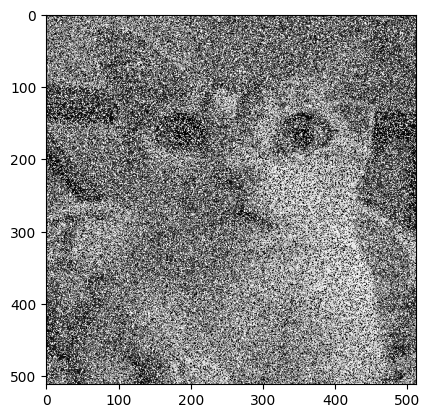

In [115]:
plt.imshow(make_noisy_image(original_img,0.5),cmap='gray')

# PSNR Calculator

In [116]:
# Formula : PSNR = 20log(Max Pixel Value) - 10logo(Mean Squared Error)

def calculate_PSNR(img,noisy_img):
    img = img.astype(np.float128)
    noisy_img = noisy_img.astype(np.float128)

    max_pixel = 255
    mean_squared_error = np.mean((img - noisy_img)**2)
    PSNR = 20*np.log10(max_pixel)-10*np.log10(mean_squared_error)

    return round(PSNR,2)

# Test PSNR Calculator

In [117]:
calculate_PSNR(img,img)

/var/folders/5_/_0y1j83907xb246mlhjdp_xr0000gn/T/ipykernel_56129/731763362.py:9: RuntimeWarning: divide by zero encountered in log10
  PSNR = 20*np.log10(max_pixel)-10*np.log10(mean_squared_error)


inf

In [118]:
cv2.PSNR(original_img,make_noisy_image(img,0.1))

Effected Pixels: 26214
Lucky Pixels :  235930


15.442164262425976

In [119]:
calculate_PSNR(img,make_noisy_image(original_img,0.1))

Effected Pixels: 26214
Lucky Pixels :  235930


15.46

In [120]:
calculate_PSNR(make_noisy_image(img,0.5),img)

Effected Pixels: 131072
Lucky Pixels :  131072


8.43

In [121]:
calculate_PSNR(make_noisy_image(img,0.9),img)

Effected Pixels: 235930


Lucky Pixels :  26214


5.88

# Filtering Image Function with (3x3) Mask

In [122]:
def filter_image(noise_mat,filter_type):
    print("Noise Matrix Shape : ",noise_mat.shape)
    filtered_image = noise_mat.copy()

    mask_size = 3 #3x3
    mask_left = mask_size//2
    mask_right = mask_left+1

    filtered_image = np.pad(filtered_image,mask_left,mode='wrap')
    print("After Padding Shape : ",filtered_image.shape)


    if filter_type == "median":
        for i in range (mask_left,height+1):
            for j in range(mask_left,width+1):
                median = np.median(filtered_image[(i-mask_left):(i+mask_right),(j-mask_left):(j+mask_right)])
                filtered_image[i][j] = median

    

    elif filter_type== "average":
        for i in range (mask_left,height+1):
            for j in range(mask_left,width+1):
                avg = np.mean(filtered_image[(i-mask_left):(i+mask_right),(j-mask_left):(j+mask_right)])
                filtered_image[i][j] = avg
        
    print("Filtered Image Shape : ",filtered_image.shape)
    return np.array(filtered_image[1:height+1,1:width+1])


# Apply 90% Salt to the Image and Filter

Effected Pixels: 235930
Lucky Pixels :  26214


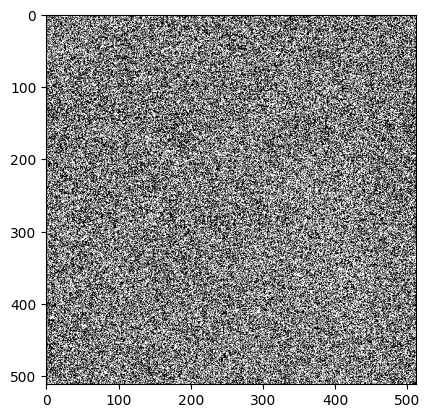

Noise Matrix Shape :  (512, 512)
After Padding Shape :  (514, 514)
Filtered Image Shape :  (514, 514)


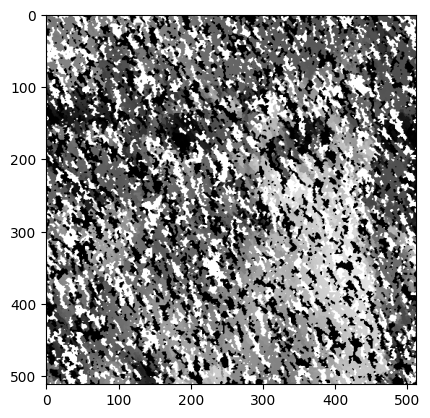

In [123]:
test_noisy_image = make_noisy_image(original_img,0.90)

plt.imshow(test_noisy_image,cmap='gray')
plt.show()

filtered_image = filter_image(test_noisy_image,"median")
plt.imshow(filtered_image,cmap='gray')
plt.show()

In [124]:
original_img.shape

(512, 512)

In [125]:
xx = filter_image(original_img,filter_type='median')
print(xx.shape)

Noise Matrix Shape :  (512, 512)
After Padding Shape :  (514, 514)
Filtered Image Shape :  (514, 514)
(512, 512)


# Apply Median Filter with Wrap Padding

### Subplots

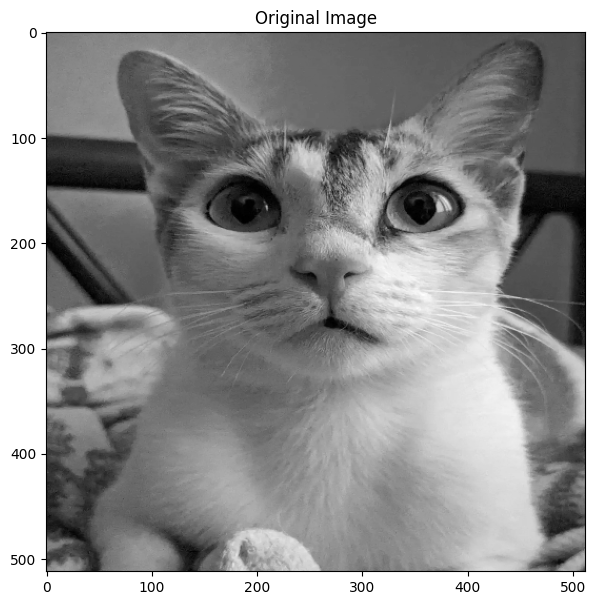

Effected Pixels: 13173
Lucky Pixels :  248971
Noise Applied on 0.5% pixels
Generated Noisy Image Image : 1/20
Noise Matrix Shape :  (512, 512)
After Padding Shape :  (514, 514)


/var/folders/5_/_0y1j83907xb246mlhjdp_xr0000gn/T/ipykernel_56129/1028594519.py:20: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(10,2,i) #3


Filtered Image Shape :  (514, 514)
Generated Filtered Image : 2/20
Effected Pixels: 39519
Lucky Pixels :  222625
Noise Applied on 1.5% pixels
Generated Noisy Image Image : 3/20
Noise Matrix Shape :  (512, 512)
After Padding Shape :  (514, 514)
Filtered Image Shape :  (514, 514)
Generated Filtered Image : 4/20
Effected Pixels: 65865
Lucky Pixels :  196279
Noise Applied on 2.5% pixels
Generated Noisy Image Image : 5/20
Noise Matrix Shape :  (512, 512)
After Padding Shape :  (514, 514)
Filtered Image Shape :  (514, 514)
Generated Filtered Image : 6/20
Effected Pixels: 92211
Lucky Pixels :  169933
Noise Applied on 3.5% pixels
Generated Noisy Image Image : 7/20
Noise Matrix Shape :  (512, 512)
After Padding Shape :  (514, 514)
Filtered Image Shape :  (514, 514)
Generated Filtered Image : 8/20
Effected Pixels: 118558
Lucky Pixels :  143586
Noise Applied on 4.5% pixels
Generated Noisy Image Image : 9/20
Noise Matrix Shape :  (512, 512)
After Padding Shape :  (514, 514)
Filtered Image Shape : 

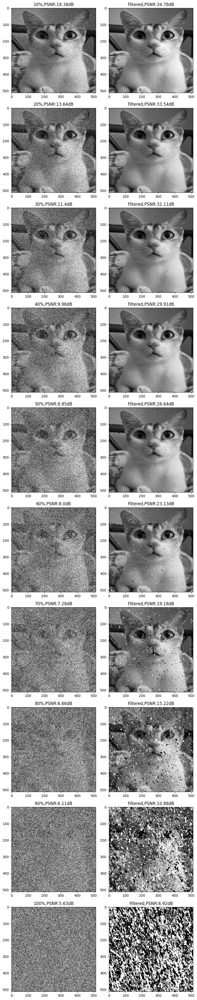

In [126]:
# Original Image Plot
plt.figure(figsize=(7,7))
plt.imshow(original_img,cmap='gray')
plt.title("Original Image")
plt.show()

plt.figure(figsize=(8,40))
plt.title("Noisy Image & Median Filter")
# Noisy - Filtered Image Plot

cnt = 10

for i in range(1,21,1):


    if i%2==1:
        # Noisy Image Show
        cur_noisy_img = make_noisy_image(img,float(i/(20-0.1)))
        print(f"Noise Applied on {round(float(i/(20-0.1)),2)*10}% pixels")
        plt.subplot(10,2,i) #3

        plt.imshow(cur_noisy_img,cmap='gray')
        plt.title(f"{cnt}%,PSNR:{calculate_PSNR(img,cur_noisy_img)}dB")
        cnt+=10
        print(f"Generated Noisy Image Image : {i}/20")

    else:
        # Filtered Image Show
        cur_filtered_img = filter_image(cur_noisy_img,"median")

        plt.subplot(10,2,i) #3

        plt.imshow(cur_filtered_img,cmap='gray')
        plt.title(f"Filtered,PSNR:{calculate_PSNR(img,cur_filtered_img)}dB")

        print(f"Generated Filtered Image : {i}/20")


plt.tight_layout()
plt.savefig("PSNR_TEST_MEDIAN.jpg")
plt.show()


# Apply Average Filter with Wrap Padding

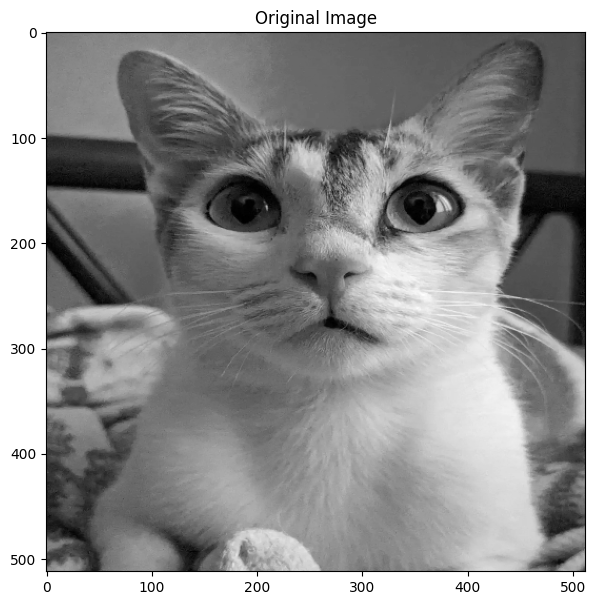

Effected Pixels: 13173
Lucky Pixels :  248971
Noise Applied on 0.5% pixels
Generated Noisy Image Image : 1/20
Noise Matrix Shape :  (512, 512)
After Padding Shape :  (514, 514)


/var/folders/5_/_0y1j83907xb246mlhjdp_xr0000gn/T/ipykernel_56129/2164398381.py:21: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(10,2,i) #3


Filtered Image Shape :  (514, 514)
Generated Filtered Image : 2/20
Effected Pixels: 39519
Lucky Pixels :  222625
Noise Applied on 1.5% pixels
Generated Noisy Image Image : 3/20
Noise Matrix Shape :  (512, 512)
After Padding Shape :  (514, 514)
Filtered Image Shape :  (514, 514)
Generated Filtered Image : 4/20
Effected Pixels: 65865
Lucky Pixels :  196279
Noise Applied on 2.5% pixels
Generated Noisy Image Image : 5/20
Noise Matrix Shape :  (512, 512)
After Padding Shape :  (514, 514)
Filtered Image Shape :  (514, 514)
Generated Filtered Image : 6/20
Effected Pixels: 92211
Lucky Pixels :  169933
Noise Applied on 3.5% pixels
Generated Noisy Image Image : 7/20
Noise Matrix Shape :  (512, 512)
After Padding Shape :  (514, 514)
Filtered Image Shape :  (514, 514)
Generated Filtered Image : 8/20
Effected Pixels: 118558
Lucky Pixels :  143586
Noise Applied on 4.5% pixels
Generated Noisy Image Image : 9/20
Noise Matrix Shape :  (512, 512)
After Padding Shape :  (514, 514)
Filtered Image Shape : 

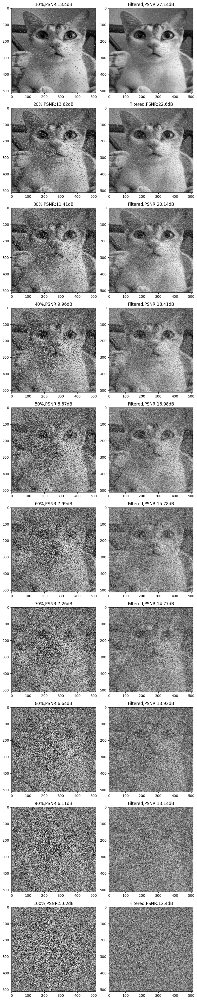

In [127]:
# Original Image Plot
plt.figure(figsize=(7,7))
plt.imshow(original_img,cmap='gray')
plt.title("Original Image")
plt.show()

plt.figure(figsize=(8,40))
plt.title("Noisy Image & Median Filter")
# Noisy - Filtered Image Plot

cnt = 10

for i in range(1,21,1):



    if i%2==1:
        # Noisy Image Show
        cur_noisy_img = make_noisy_image(img,float(i/(20-0.1)))
        print(f"Noise Applied on {round(float(i/(20-0.1)),2)*10}% pixels")
        plt.subplot(10,2,i) #3

        plt.imshow(cur_noisy_img,cmap='gray')
        plt.title(f"{cnt}%,PSNR:{calculate_PSNR(img,cur_noisy_img)}dB")
        cnt+=10
        print(f"Generated Noisy Image Image : {i}/20")

    else:
        # Filtered Image Show
        cur_filtered_img = filter_image(cur_noisy_img,"average")

        plt.subplot(10,2,i) #3

        plt.imshow(cur_filtered_img,cmap='gray')
        plt.title(f"Filtered,PSNR:{calculate_PSNR(img,cur_filtered_img)}dB")

        print(f"Generated Filtered Image : {i}/20")


plt.tight_layout()
plt.savefig("PSNR_TEST_AVG.jpg")
plt.show()


Effected Pixels: 52429
Lucky Pixels :  209715


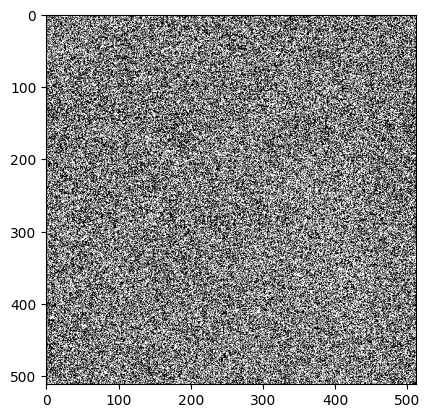

In [128]:
test_noise_img = make_noisy_image(original_img,0.2)
plt.imshow(test_noisy_image,cmap='gray')
plt.show()